In [1]:
%%capture
!pip install torchsummary
!pip install MoviePy

In [2]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary
import torchvision
from torchvision.utils import save_image, make_grid
from torch.autograd import Variable
import numpy as np
import cv2
from tqdm.auto import tqdm
import os
import matplotlib.pyplot as plt

In [3]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DEVICE

'cuda'

In [4]:
class Encoder(nn.Module):
    def __init__(self,in_channels=3):
        super(Encoder, self).__init__()
        hidden_dims = [32, 64, 128, 256, 512]
        strides = [1,2,2,2,2]
        same_padding = [1,2,2,2,2]
        modules = []
        for i in range(len(hidden_dims)):
            modules.append(
                nn.Sequential(
                    nn.Conv2d(in_channels, out_channels=hidden_dims[i],
                              kernel_size= 5, stride = strides[i], padding  = same_padding[i]),
                    nn.BatchNorm2d(hidden_dims[i]),
                    nn.LeakyReLU(0.2))
            )
            in_channels = hidden_dims[i]
        modules.append(nn.Sequential(nn.Flatten(start_dim=1),
                                     nn.Linear(8192,1024),
                                     nn.BatchNorm1d(1024),
                                     nn.LeakyReLU(0.2)))

        self.encoder = nn.Sequential(*modules)

    def forward(self,X):
        X = self.encoder(X)
        return X


class Decoder(nn.Module):
    def __init__(self,in_channels=3):
        super(Decoder, self).__init__()
        
        hidden_dims = [512, 256, 128, 64, 32]
        strides = [2,2,2,2,1]
        same_padding = [2,2,2,2,1]
        modules = []
        for i in range(len(hidden_dims)-1):
            modules.append(
                nn.Sequential(
                    nn.ConvTranspose2d(hidden_dims[i],
                                       hidden_dims[i+1],
                                       kernel_size=5,
                                       stride = strides[i],
                                       padding=same_padding[i],
                                       output_padding=1),
                    nn.BatchNorm2d(hidden_dims[i+1]),
                    nn.LeakyReLU(0.2)))
            
        modules.append(nn.Sequential(nn.Conv2d(32, 16, kernel_size=5,stride=1,padding=2, bias=False),
                                nn.BatchNorm2d(16),
                                nn.LeakyReLU(0.2),
                                nn.Conv2d(16, 3, kernel_size=3,stride=1, padding=1, bias=False),
                                nn.Sigmoid()))
                       
        self.decoder = nn.Sequential(*modules)
        
    def forward(self,X):
        return self.decoder(X)

class VAE(nn.Module):
    def __init__(self, encoder, decoder, device = "cpu",kld_weight = 1):
        super(VAE, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.device = device
        self.mu = nn.Sequential(nn.Linear(1024,512),
                                nn.BatchNorm1d(512),
                                nn.LeakyReLU(0.2)
                                )
        self.var = nn.Sequential(nn.Linear(1024,512),
                                 nn.BatchNorm1d(512),
                                 nn.LeakyReLU(0.2)
                                 )
        self.linear = nn.Sequential(
                                    nn.Linear(512,1024),
                                    nn.BatchNorm1d(1024),
                                    nn.LeakyReLU(0.2),
                                    nn.Linear(1024,8192),
                                    nn.BatchNorm1d(8192),
                                    nn.LeakyReLU(0.2)
                                   )
        self.kld_weight = kld_weight
        self.to(self.device)

    def reparameterize(self, X):
        mu, var = self.mu(X), self.var(X)
        kld_loss = -0.5 * torch.mean(1 + var - mu.pow(2) - var.exp()) * self.kld_weight 
        sigma = torch.exp(0.5 * var)
        std_z = torch.randn_like(sigma).to(self.device)
        self.z_sigma = sigma
        self.z_mean = mu
        z = mu + sigma * std_z
        z = self.linear(z)
        z = z.view(-1, 512, 4, 4)
        return z, kld_loss

    def forward(self, state):
        X = self.encoder(state)
        z, kl_loss = self.reparameterize(X)
        return self.decoder(z), kl_loss

    def sample_latent(self,num):
        z = torch.randn(num,512).to(self.device)
        z = self.linear(z)
        z = z.view(-1, 512, 4, 4)
        return z

    def generate(self,num=1,z=None):
        if z is None:
            z = self.sample_latent(num)
        else:
            z = self.linear(z)
            z = z.view(-1, 512, 4, 4)
        return self.decoder(z)

In [5]:
encoder = Encoder()
decoder = Decoder()
dummy_en = VAE(encoder, decoder, device = DEVICE,kld_weight=0.003)
summary(dummy_en, (3, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 62, 62]           2,432
       BatchNorm2d-2           [-1, 32, 62, 62]              64
         LeakyReLU-3           [-1, 32, 62, 62]               0
            Conv2d-4           [-1, 64, 31, 31]          51,264
       BatchNorm2d-5           [-1, 64, 31, 31]             128
         LeakyReLU-6           [-1, 64, 31, 31]               0
            Conv2d-7          [-1, 128, 16, 16]         204,928
       BatchNorm2d-8          [-1, 128, 16, 16]             256
         LeakyReLU-9          [-1, 128, 16, 16]               0
           Conv2d-10            [-1, 256, 8, 8]         819,456
      BatchNorm2d-11            [-1, 256, 8, 8]             512
        LeakyReLU-12            [-1, 256, 8, 8]               0
           Conv2d-13            [-1, 512, 4, 4]       3,277,312
      BatchNorm2d-14            [-1, 51

In [6]:
class AnimeDataset(Dataset):
    def __init__(self, img_pths, device = "cpu"):
        self.device = device
        self.img_pths = img_pths

    def __len__(self):
        return len(self.img_pths)
    
    def __getitem__(self, id):
        img = cv2.imread(self.img_pths[id], cv2.IMREAD_COLOR)
        img = cv2.resize(img,(64,64))
        img = np.moveaxis(img, 2, 0)
        img = torch.tensor(img, dtype = torch.float).to(self.device)
        return img/255.0

In [7]:
class Trainer:
    def __init__(self, vae, optimizer, device = DEVICE, load_pretrained=True):
        self.vae = vae
        self.device = device
        self.mse = nn.MSELoss(reduction='mean')
        self.optimizer = optimizer
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, 5, gamma=0.9, verbose=True)
        self.best_loss = None
        if load_pretrained:
            self.load() 

    def fit(self, train_loader, epoch_num, save = True):
        train_loader = tqdm(train_loader)
        train_loader = enumerate(train_loader)
        r_loss = 0
        k_loss = 0
        self.vae.train()
        for i,X in train_loader:
            final_image,kl_loss = self.vae(X)
            recon_loss = self.mse(final_image,X)
            loss = kl_loss + recon_loss 
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()
            r_loss+=recon_loss.detach().item()
            k_loss+=kl_loss.detach().item()
        r_loss/=(i+1)
        k_loss/=(i+1)
        print("epoch : {} | recon_loss : {} | kl_loss : {}".format(epoch_num,r_loss,k_loss))
        self.scheduler.step()
        if save:
            if self.best_loss == None:
                self.best_loss = r_loss+k_loss
                self.save()
            if r_loss+k_loss < self.best_loss:
                self.best_loss = r_loss+k_loss
                self.save()

    def test(self, train_loader):
        for X in train_loader:
            break
        self.vae.eval()
        X = X[:36]
        output,_ = self.vae(X)
        fig, ax = plt.subplots(1,2,figsize=(16, 8))
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].title.set_text('INPUT IMAGES')
        ax[0].imshow(cv2.cvtColor(make_grid(X.cpu().detach(), nrow=6).permute(1, 2, 0).numpy(), cv2.COLOR_BGR2RGB))
        ax[1].set_xticks([])
        ax[1].set_yticks([])
        ax[1].title.set_text('RECONSTRUCTED IMAGES')
        ax[1].imshow(cv2.cvtColor(make_grid(output.cpu().detach(), nrow=6).permute(1, 2, 0).numpy(), cv2.COLOR_BGR2RGB))
        plt.show()


    def save(self):
        torch.save(self.vae.state_dict(), "vae.pth")
        print("weight saved!!")
    
    def load(self):
        print("loading weights...")
        self.vae.load_state_dict(torch.load( "../input/vae-models/vae.pth"))
        print("weights loaded..")

    def generate(self):
        self.vae.eval()
        output = self.vae.generate(num=1)
        output = output.detach().cpu().numpy()[0]
        output = np.transpose(output1, [1,2,0])
        output = np.asarray(output1*255.0, dtype = np.int32)
        fig, ax = plt.subplots(1, 1,figsize=(3,3))
        ax[0].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))        
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].title.set_text('GENERATED IMAGE')
        plt.show()
        
    def save_samples(self,epoch_num, latent_tensors, show=True, save=True):
        self.vae.eval()
        images = self.vae.generate(num = 64, z = latent_tensors)
        fname = './generated-images-{0:0=4d}.png'.format(epoch_num)
        if save:
            save_image(images, fname, nrow=8)
            print('Saving', fname)
        if show:
            fig, ax = plt.subplots(figsize=(12, 12))
            ax.set_xticks([]); ax.set_yticks([])
            img = make_grid(images.cpu().detach(), nrow=8).permute(1, 2, 0).numpy()
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.show()

In [8]:
img_pths = []
files = os.listdir("../input/animefacedataset/images/")
for i in files:
    img_pths.append("../input/animefacedataset/images/"+str(i))

In [9]:
BATCH_SIZE = 128
dataloader = AnimeDataset(img_pths, device = DEVICE)
train_dataloader = DataLoader(dataloader,
                              batch_size = BATCH_SIZE,
                              shuffle = True)
encoder = Encoder()
decoder = Decoder()
vae = VAE(encoder, decoder, device = DEVICE,kld_weight=0.03)
optimizer = Adam(vae.parameters(), lr = 0.0001,betas=(0.5, 0.999))
trainer = Trainer(vae, optimizer, load_pretrained=True)

Adjusting learning rate of group 0 to 1.0000e-04.
loading weights...
weights loaded..


In [10]:
training = False

Saving ./generated-images-0000.png


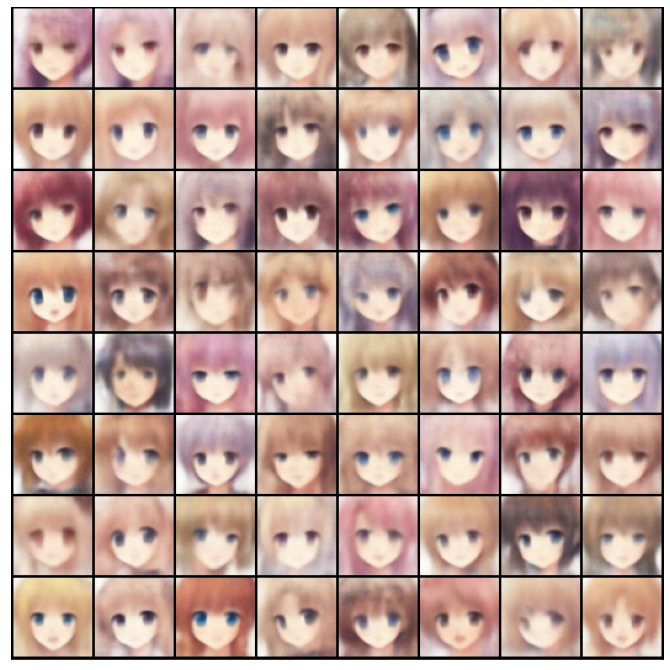

Saving ./generated-images-0001.png


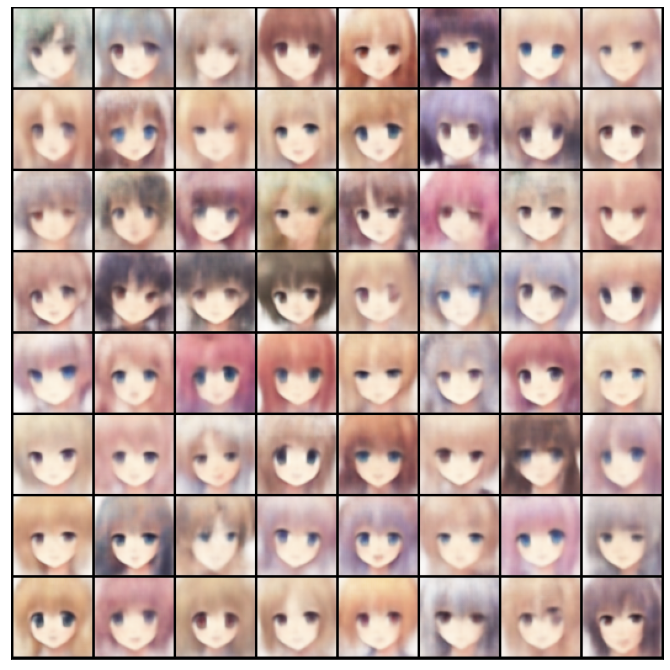

Saving ./generated-images-0002.png


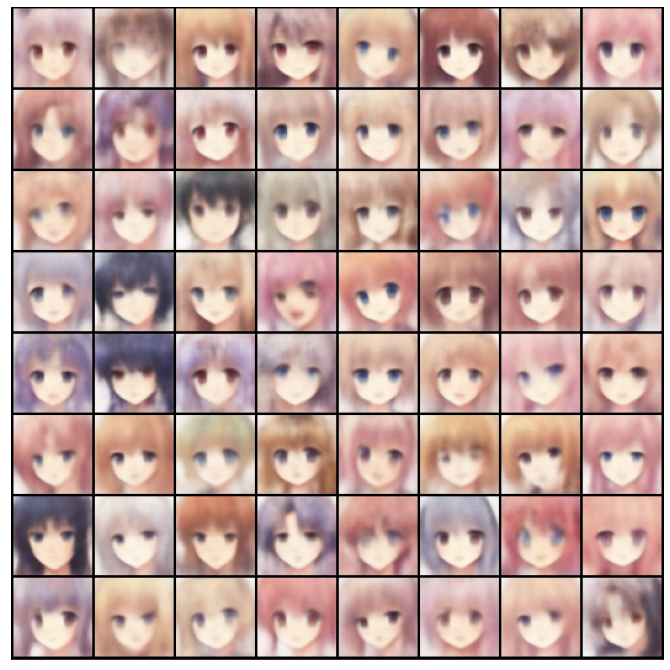

Saving ./generated-images-0003.png


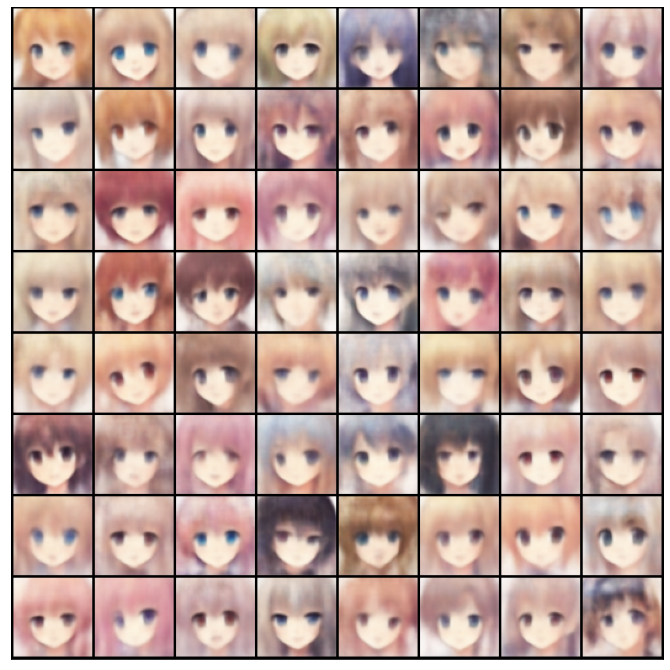

Saving ./generated-images-0004.png


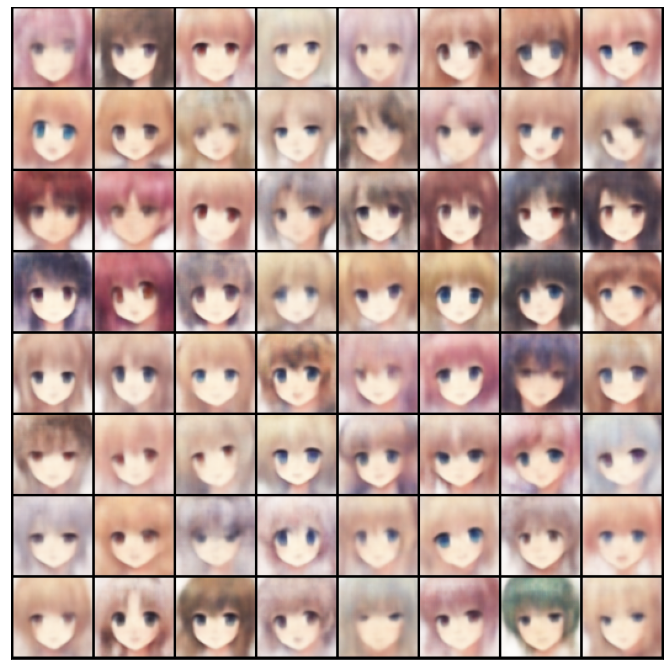

Saving ./generated-images-0005.png


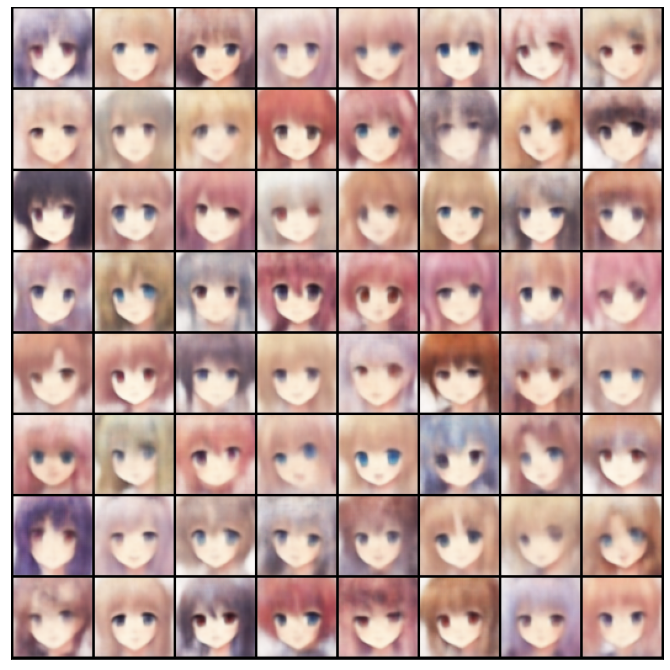

Saving ./generated-images-0006.png


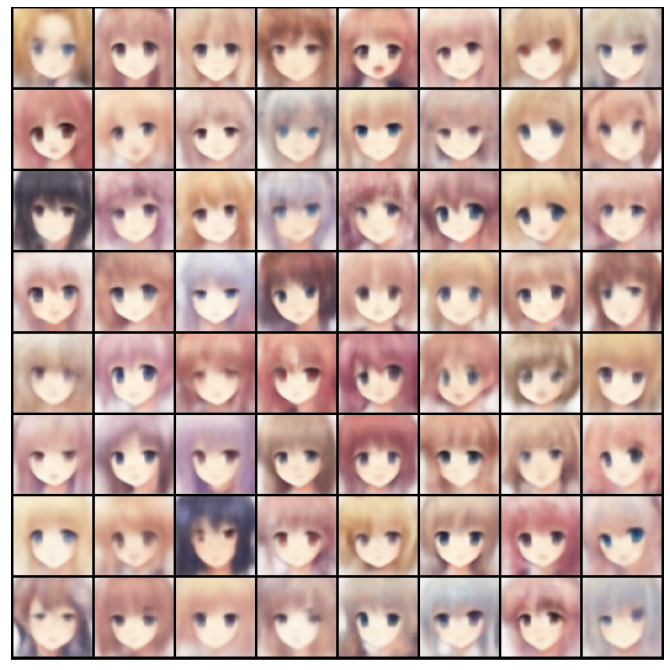

Saving ./generated-images-0007.png


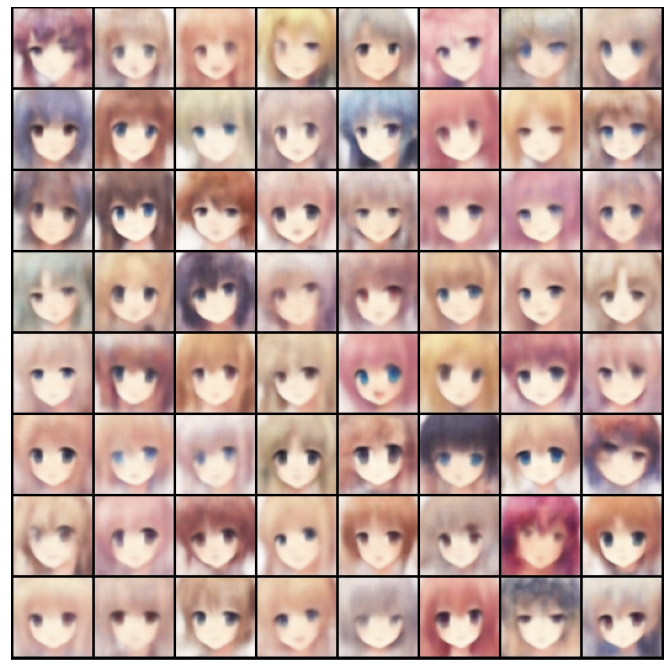

Saving ./generated-images-0008.png


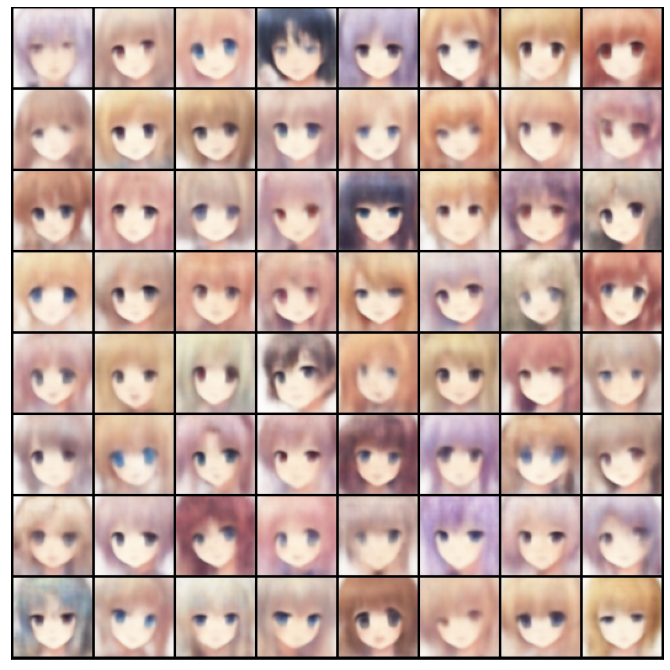

Saving ./generated-images-0009.png


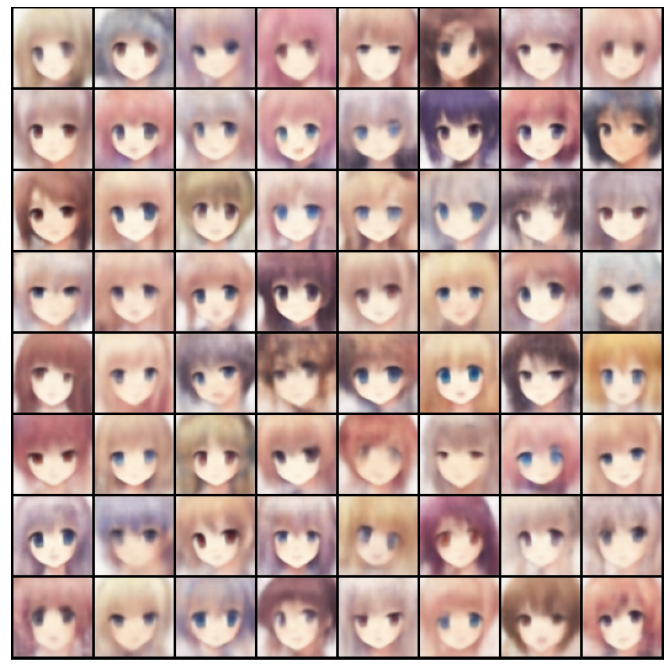

Saving ./generated-images-0010.png


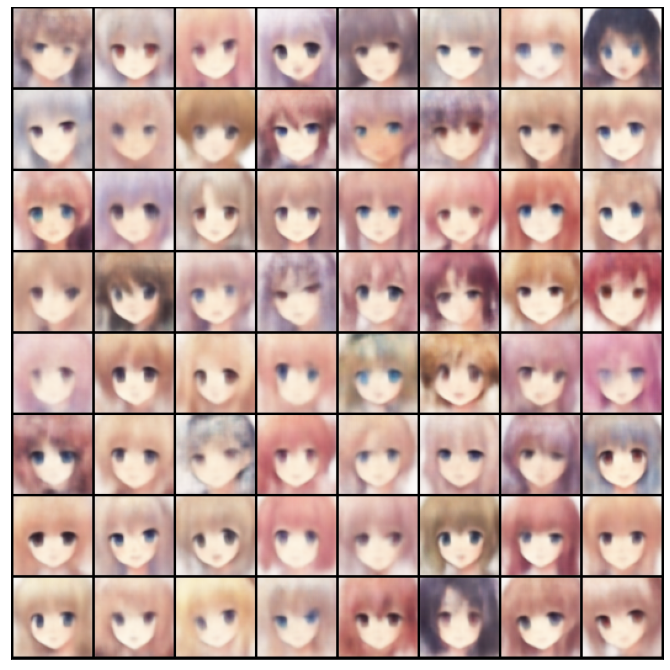

Saving ./generated-images-0011.png


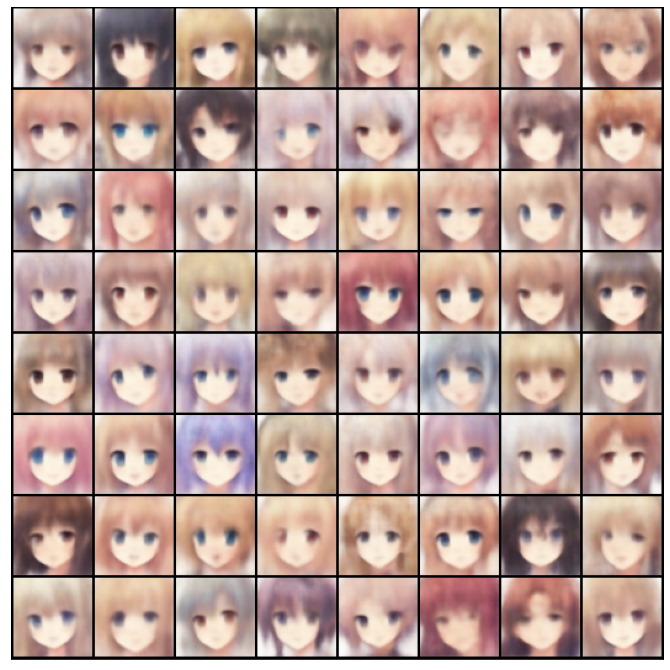

Saving ./generated-images-0012.png


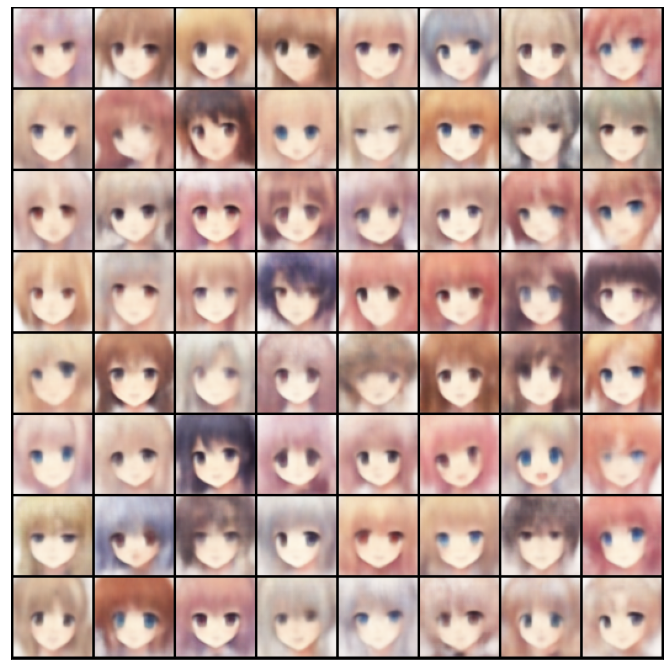

Saving ./generated-images-0013.png


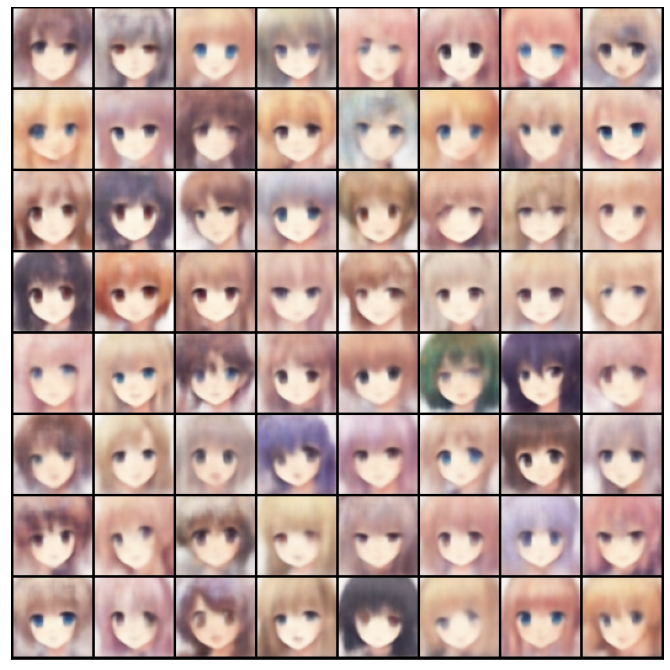

Saving ./generated-images-0014.png


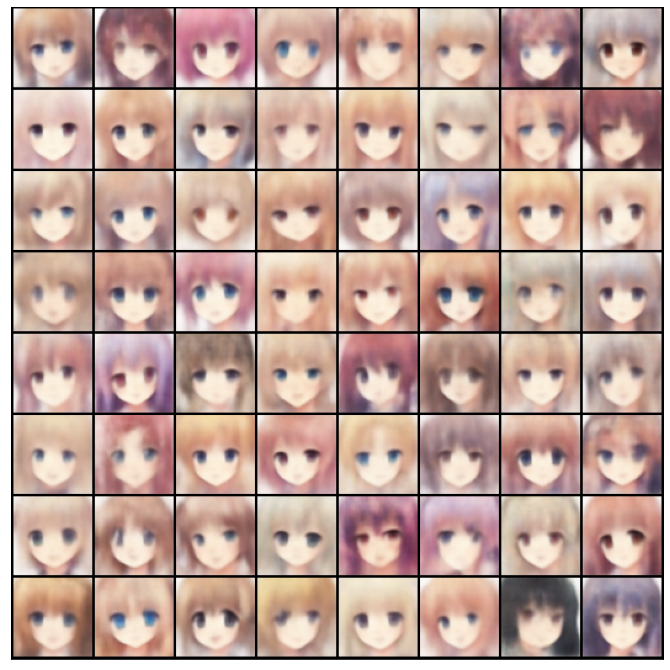

In [11]:
if training:
    fixed_latent = torch.load('../input/vae-models/fixed_latent.pt')
    for epoch in range(100):
        trainer.fit(train_dataloader, epoch, save = True)
        trainer.test(train_dataloader)
        trainer.save_samples(epoch, fixed_latent, show=True,save=True)
else:
    for epoch in range(15):
        random_latent = torch.randn((64,512), device=DEVICE)
        trainer.save_samples(epoch, random_latent, show=True,save=True)

In [12]:
vid_fname = 'training.avi'

files = [os.path.join("../input/vae-models/training_results/", f) for f in os.listdir("../input/vae-models/training_results/") if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 2, (530,530))
[out.write(cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)) for fname in files]
out.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'avi / AVI (Audio Video Interleaved)'
OpenCV: FFMPEG: fallback to use tag 0x34504d46/'FMP4'


In [13]:
%%capture
from moviepy.editor import *

clip = (VideoFileClip("./training.avi"))
clip.write_gif("training.gif")